# Bayesian inversion of diffusivity in Poisson equation

In [1]:
import sys
import os
import time
import numpy as np
import dolfin as dl

import pickle

import torch

from scipy.interpolate import griddata

model_path = "../../problems/poisson/"
sys.path.append(model_path)
from poissonModel import PoissonModel

src_path = "../../../src/"
sys.path.append(src_path + 'plotting')
from field_plot import *
from plot_mix_collection import *
from point_plot import *
from plot_curve import plot_curve

sys.path.append(src_path + 'prior')
from priorSampler import PriorSampler

sys.path.append(src_path + 'pde')
from fenicsUtilities import function_to_vertex

sys.path.append(src_path + 'mcmc')
from mcmc import MCMC
from mcmc_plot_fields import mcmc_plot_fields, mcmc_plot_fields_base
from compute_sample_errors import compute_sample_errors

sys.path.append(src_path + 'nn/deeponet')
sys.path.append(src_path + 'data/')
sys.path.append(src_path + 'nn/mlp')
from load_data_and_deeponet import load_data_and_deeponet

sys.path.append(src_path + 'nn/pcanet')
from load_data_and_pcanet import load_data_and_pcanet

sys.path.append(src_path + 'nn/fno')
from load_data_and_fno import load_data_and_fno

import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
plt.rcParams['text.latex.preamble'] = r'\usepackage{amsmath}'

# set seed
seed = 0
np.random.seed(seed)

In [2]:
model_data_folder = model_path + 'data/'
current_directory = os.getcwd()  
results_dir = current_directory + '/Results/'
if not os.path.exists(results_dir):
    os.makedirs(results_dir)

# Create PoissonModel

In [3]:
prior_ac = 0.005
prior_cc = 0.2
prior_logn_scale = 1
prior_logn_translate = 0.
nx, ny = 50, 50
fe_order = 1
data_prefix = 'Poisson'

# create mesh
mesh = dl.UnitSquareMesh(nx, ny)

# create function spaces
Vm = dl.FunctionSpace(mesh, 'Lagrange', fe_order)
Vu = Vm

# create prior sampler
prior_sampler = PriorSampler(Vm, prior_ac, prior_cc, seed)

# create model
model = PoissonModel(Vm, Vu, prior_sampler, prior_logn_scale, prior_logn_translate, seed)

# Load Neural Operators

In [4]:
class SurrogateModel:
    def __init__(self, true_model, model, data):
        self.true_model = true_model
        self.model = model
        self.data = data
        self.model_type = self.model.name
        self.w_to_m = None
        self.u = None

    def solveFwd(self, w):
        if self.model_type == 'DeepONet':
            self.w_to_m = self.true_model.transform_gaussian_pointwise(w)
            self.u = self.data.decoder_Y(self.model.predict(self.data.encoder_X(self.w_to_m), self.data.X_trunk).detach().numpy())
        elif self.model_type == 'PCANet':
            self.w_to_m = self.true_model.transform_gaussian_pointwise(w)
            self.u = self.data.decoder_Y(self.model.predict(self.data.encoder_X(self.w_to_m)).detach().numpy())
        else:
            raise Exception('Unknown model type')

        return self.u

In [5]:
def load_deeponet():
    data_path = model_path + 'data/' + 'Poisson_samples.npz'
    nn_path = model_path + 'DeepONet/Results/model.pkl'
    data, nn = load_data_and_deeponet(data_path, nn_path)
    nn_surrogate = SurrogateModel(model, nn, data)
    print('nn_data: ', data)
    print('nn_model: ', nn)

    return nn_surrogate

deeponet = load_deeponet()

/home/prashant/Dropbox/Work/Simulations/neuralnet_works/error_corrector_direction/neural_operators/survey_work/applications/bayesian_inverse_problem/../../../src/nn/deeponet/load_data_and_deeponet.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please op

nn_data:  <dataMethods.DataProcessor object at 0x7dfed0693d10>
nn_model:  DeepONet(
  (branch_net): MLP(
    (layers): ModuleList(
      (0): Linear(in_features=2601, out_features=64, bias=True)
      (1): Linear(in_features=64, out_features=64, bias=True)
      (2): Linear(in_features=64, out_features=100, bias=True)
    )
  )
  (trunk_net): MLP(
    (layers): ModuleList(
      (0): Linear(in_features=2, out_features=64, bias=True)
      (1): Linear(in_features=64, out_features=64, bias=True)
      (2): Linear(in_features=64, out_features=100, bias=True)
    )
  )
)


In [6]:
def load_pcanet():
    data_path = model_path + 'data/' + 'Poisson_samples.npz'
    nn_path = model_path + 'PCANet/Results/model.pkl'
    data, nn = load_data_and_pcanet(data_path, nn_path)
    nn_surrogate = SurrogateModel(model, nn, data)
    print('nn_data: ', data)
    print('nn_model: ', nn)

    return nn_surrogate

pcanet = load_pcanet()

/home/prashant/Dropbox/Work/Simulations/neuralnet_works/error_corrector_direction/neural_operators/survey_work/applications/bayesian_inverse_problem/../../../src/nn/pcanet/load_data_and_pcanet.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open a

nn_data:  <dataMethods.DataProcessor object at 0x7dfee18e2d50>
nn_model:  PCANet(
  (net): MLP(
    (layers): ModuleList(
      (0): Linear(in_features=100, out_features=250, bias=True)
      (1-2): 2 x Linear(in_features=250, out_features=250, bias=True)
      (3): Linear(in_features=250, out_features=100, bias=True)
    )
  )
)


In [7]:
def load_fno():
    data_path = model_path + 'data/' + 'Poisson_FNO_samples.npz'
    nn_path = model_path + 'FNO/Results/model.pkl'
    data, nn = load_data_and_fno(data_path, nn_path)
    nn_surrogate = SurrogateModel(model, nn, data)
    print('nn_data: ', data)
    print('nn_model: ', nn)

    return nn_surrogate

fno = load_fno()

/home/prashant/Dropbox/Work/Simulations/neuralnet_works/error_corrector_direction/neural_operators/survey_work/applications/bayesian_inverse_problem/../../../src/nn/fno/load_data_and_fno.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issu

nn_data:  <dataMethods.DataProcessorFNO object at 0x7dfed06b29d0>
nn_model:  FNO2D(
  (fno_layers): ModuleList(
    (0-2): 3 x FNO2DLayer(
      (w): Conv2d(20, 20, kernel_size=(1, 1), stride=(1, 1))
    )
  )
  (input_projector): Linear(in_features=3, out_features=20, bias=True)
  (output_projector): Linear(in_features=20, out_features=1, bias=True)
)


In [8]:
surrogate_models = {'DeepONet': deeponet, 'PCANet': pcanet, 'FNO': fno}

In [9]:
t1 = time.time()
m1 = model.samplePrior(transform_m = True)
m2 = m1.copy()
t2 = time.time()
print('Time to sample m: ', t2 - t1)

# Poisson model solver
t1 = time.time()
u_model = model.solveFwd(u = None, m = m2, transform_m = False)
t2 = time.time()
print('Time to solve Poisson model forward: ', t2 - t1)

# neural operators
sm_use = ['DeepONet', 'PCANet']
for sm in sm_use:
    t1 = time.time()
    u_sm = surrogate_models[sm].solveFwd(m2)
    t2 = time.time()
    print('Time to solve {} forward: '.format(surrogate_models[sm].model_type), t2 - t1)

Time to sample m:  0.03754138946533203
Time to solve Poisson model forward:  0.0453495979309082
Time to solve DeepONet forward:  0.047456979751586914
Time to solve PCANet forward:  0.002962350845336914


# Get ground truth

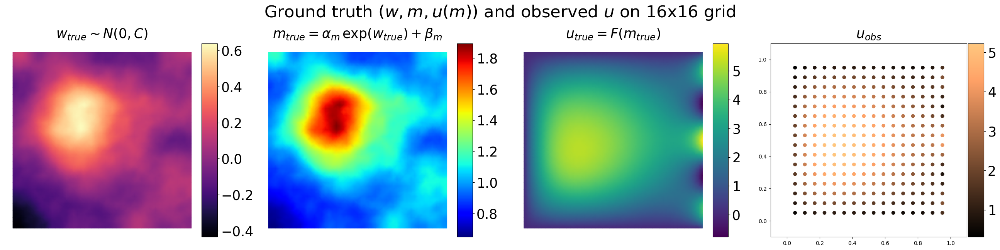

In [10]:
# load
ground_truth_data = np.load(results_dir + 'ground_truth/data.npz')
num_grid_x, num_grid_y = ground_truth_data['num_grid_x'], ground_truth_data['num_grid_y']
w_true = ground_truth_data['w_true']
m_true = ground_truth_data['m_true']
u_true = ground_truth_data['u_true']
x_obs = ground_truth_data['x_obs']
u_obs = ground_truth_data['u_obs']


rows, cols = 1, 4
fig, axs = plt.subplots(rows, cols, figsize=(26, 6))
axs = np.array([axs]) if rows == 1 else axs

uvec = [[w_true, m_true, u_true]]
title_vec = [[r'$w_{true} \sim N(0, C)$', r'$m_{true} = \alpha_m\, \exp(w_{true}) + \beta_m$', r'$u_{true} = F(m_{true})$', r'$u_{obs}$']]
cmap_vec = [['magma', 'jet', 'viridis', 'copper']]
sup_title = r'Ground truth $(w, m, u(m))$ and observed $u$ on {}x{} grid'.format(num_grid_x, num_grid_y)
fs = 25
y_sup_title = 1.075
savefilename = results_dir + 'true_and_obs_w_m_u.png'

nodes = model.Vm.mesh().coordinates()


for i in range(rows):
    for j in range(cols):

        # add grid points
        if j == cols - 1:
            axs[i,j].set_xlim([-0.1, 1.1])
            axs[i,j].set_ylim([-0.1, 1.1])
        
        if j < cols - 1:
            cbar = field_plot(axs[i,j], \
                uvec[i][j], \
                nodes, cmap = cmap_vec[i][j])
        else:
            cbar = point_plot(axs[i,j], u_obs, x_obs, cmap = cmap_vec[i][j])
        divider = make_axes_locatable(axs[i,j])
        cax = divider.append_axes('right', size='8%', pad=0.03)
        cax.tick_params(labelsize=fs)
        cbar = fig.colorbar(cbar, cax=cax, orientation='vertical')
        if j < cols - 1:
            axs[i,j].axis('off')
        if title_vec is not None:
            axs[i,j].set_title(title_vec[i][j], fontsize=fs, pad=10)        

fig.tight_layout()
if sup_title is not None:
    fig.suptitle(sup_title, fontsize=1.25*fs, y = y_sup_title)
if savefilename is not None:
    plt.savefig(savefilename,  bbox_inches='tight')
plt.show()

## Compute noise

In [11]:
u_obs_mean, u_obs_std = np.mean(u_obs), np.std(u_obs)
sigma_noise = 0.05 * u_obs_mean
print('u_obs_mean = {:.3e}, u_obs_std = {:.3e}, sigma_noise: {:.3e}'.format(u_obs_mean, u_obs_std, sigma_noise))

u_obs_mean = 2.785e+00, u_obs_std = 1.329e+00, sigma_noise: 1.393e-01


# Bayesian parameter estimation setup

In [12]:
surrogate_to_use = None

mcmc = MCMC(model, prior_sampler, ground_truth_data, \
            sigma_noise = sigma_noise, pcn_beta = 0.2, \
            surrogate_to_use = surrogate_to_use, \
            surrogate_models = surrogate_models, \
            seed = seed)

--------------------------------------------------
MCMC started with 1000 samples and 100 burnin
PCN beta: 2.000e-01, sigma_noise: 1.393e-01
Model used for solving the forward problem: True Model
Tracer save path: test_mcmc_results_n_samples_1000_n_burnin_100_pcn_beta_0.200_sigma_1.393e-01
Tracer save filename: tracer
--------------------------------------------------
initializing the current state. Initial cost: 2.488e+03
--------------------------------------------------
Burnin:    0, Cost: 2.285e+03
--------------------------------------------------
--------------------------------------------------
Burnin:   50, Cost: 2.866e+02
--------------------------------------------------
--------------------------------------------------
Sample:  100, Accepted samples:    0, Acceptance Rate: 0.000e+00, Cost mean: 0.000e+00. 
Tracing 50 samples took 5.870e+00s
Error (%) in w: ||w - w_mean|| = 1.000e+02, ||w - w_sample|| = 1.000e+02
Error (%) in m: ||m - m_mean|| = 2.244e+01, ||m - m_sample|| 

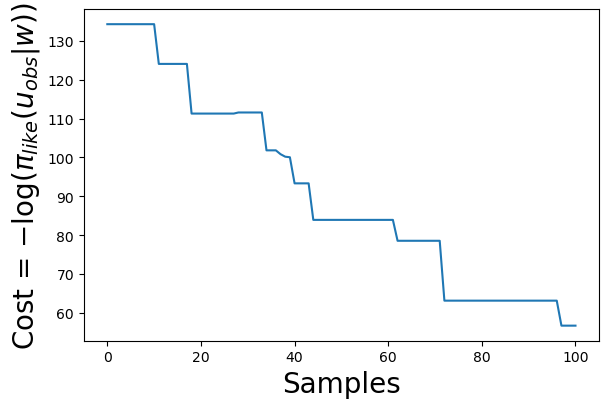

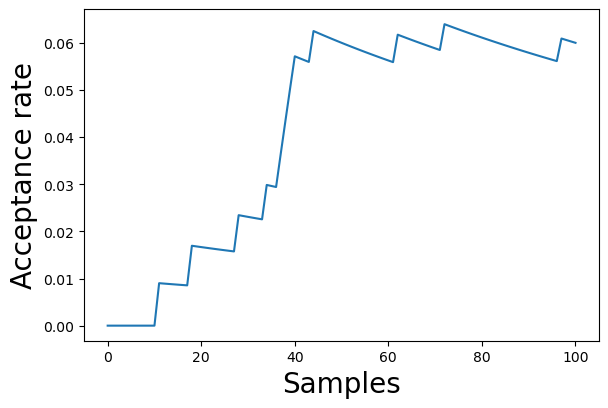

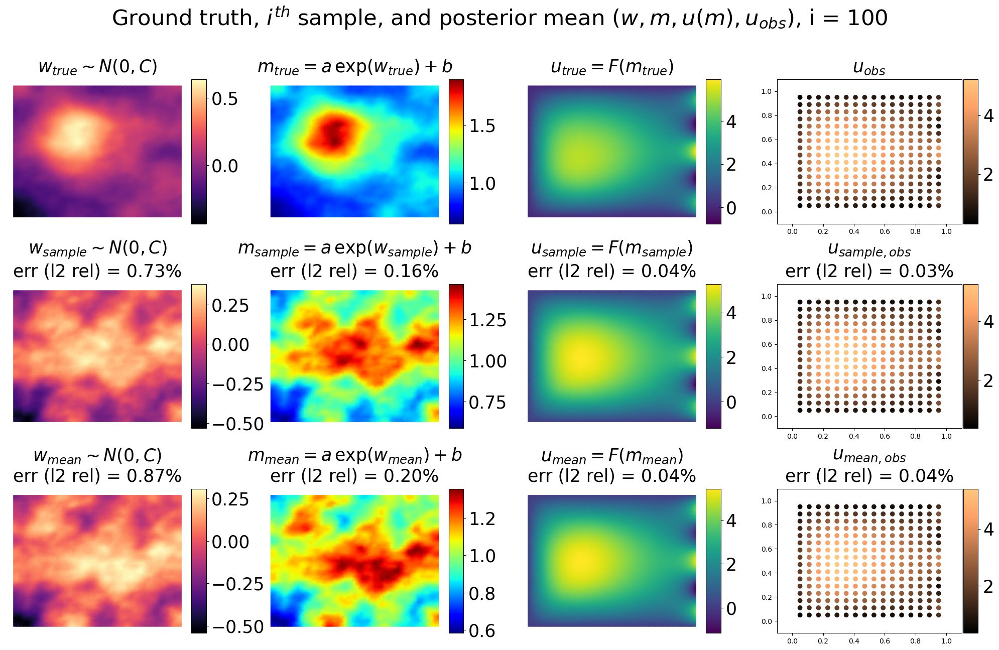

--------------------------------------------------
Sample:  250, Accepted samples:   15, Acceptance Rate: 6.000e-02, Cost mean: 7.921e+01. 
Tracing 50 samples took 1.145e+01s
Error (%) in w: ||w - w_mean|| = 8.160e+01, ||w - w_sample|| = 7.340e+01
Error (%) in m: ||m - m_mean|| = 1.853e+01, ||m - m_sample|| = 1.654e+01
Error (%) in u: ||u - u_mean|| = 3.591e+00, ||u - u_sample|| = 3.541e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 3.173e+00, ||u_obs - u_obs_sample|| = 2.805e+00
--------------------------------------------------
--------------------------------------------------
Sample:  300, Accepted samples:   18, Acceptance Rate: 6.000e-02, Cost mean: 7.122e+01. 
Tracing 50 samples took 5.926e+00s
Error (%) in w: ||w - w_mean|| = 7.828e+01, ||w - w_sample|| = 6.769e+01
Error (%) in m: ||m - m_mean|| = 1.781e+01, ||m - m_sample|| = 1.541e+01
Error (%) in u: ||u - u_mean|| = 3.431e+00, ||u - u_sample|| = 2.950e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 2.958e+00, ||u_obs - u_

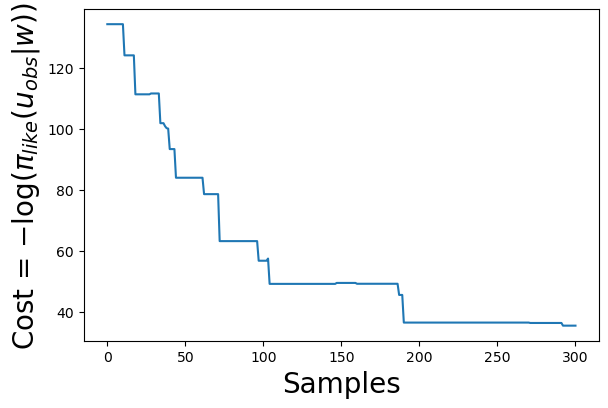

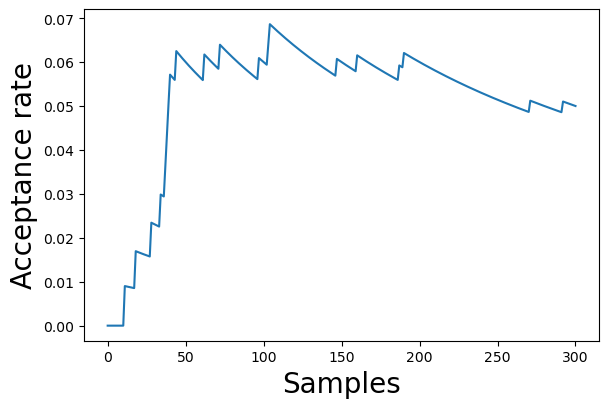

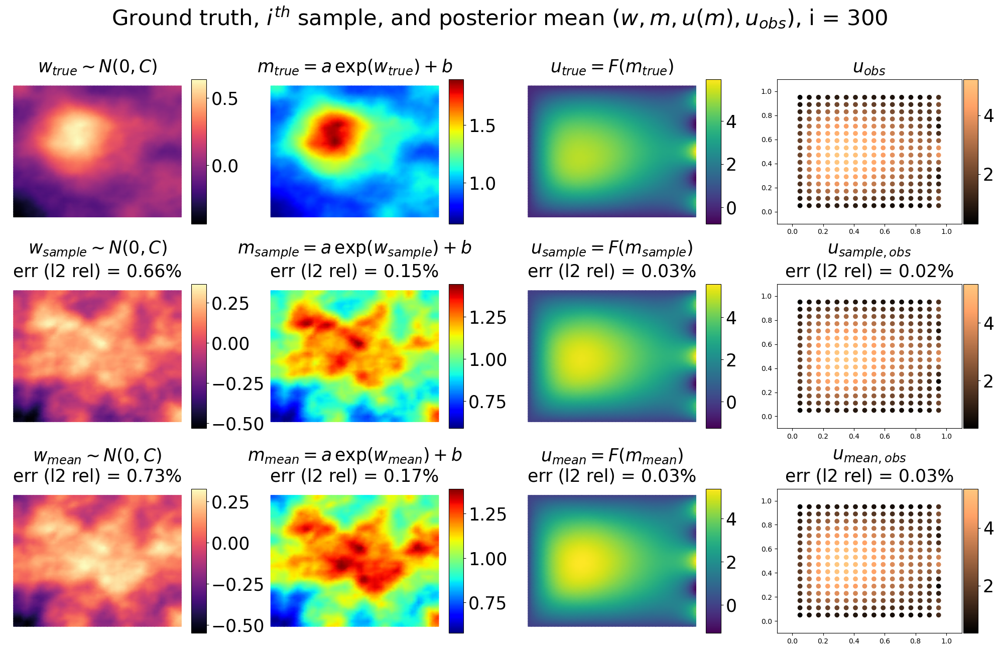

--------------------------------------------------
Sample:  450, Accepted samples:   20, Acceptance Rate: 4.444e-02, Cost mean: 5.583e+01. 
Tracing 50 samples took 1.132e+01s
Error (%) in w: ||w - w_mean|| = 7.202e+01, ||w - w_sample|| = 6.649e+01
Error (%) in m: ||m - m_mean|| = 1.650e+01, ||m - m_sample|| = 1.530e+01
Error (%) in u: ||u - u_mean|| = 3.069e+00, ||u - u_sample|| = 2.788e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 2.604e+00, ||u_obs - u_obs_sample|| = 2.375e+00
--------------------------------------------------
--------------------------------------------------
Sample:  500, Accepted samples:   20, Acceptance Rate: 4.000e-02, Cost mean: 5.323e+01. 
Tracing 50 samples took 6.516e+00s
Error (%) in w: ||w - w_mean|| = 7.101e+01, ||w - w_sample|| = 6.649e+01
Error (%) in m: ||m - m_mean|| = 1.630e+01, ||m - m_sample|| = 1.530e+01
Error (%) in u: ||u - u_mean|| = 3.013e+00, ||u - u_sample|| = 2.788e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 2.555e+00, ||u_obs - u_

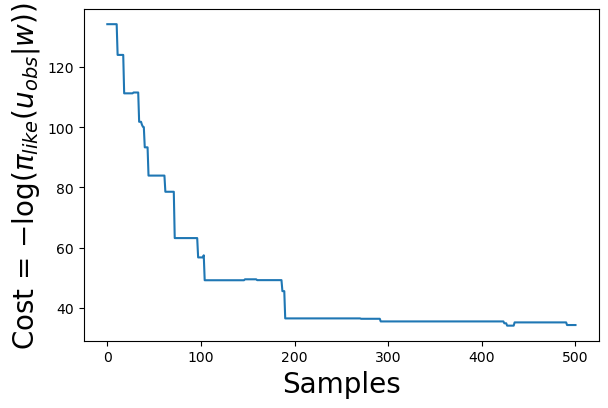

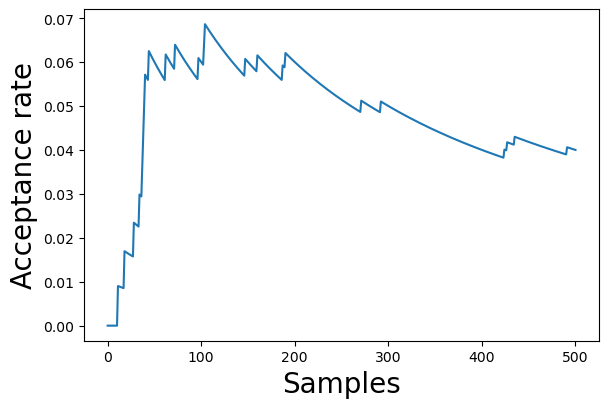

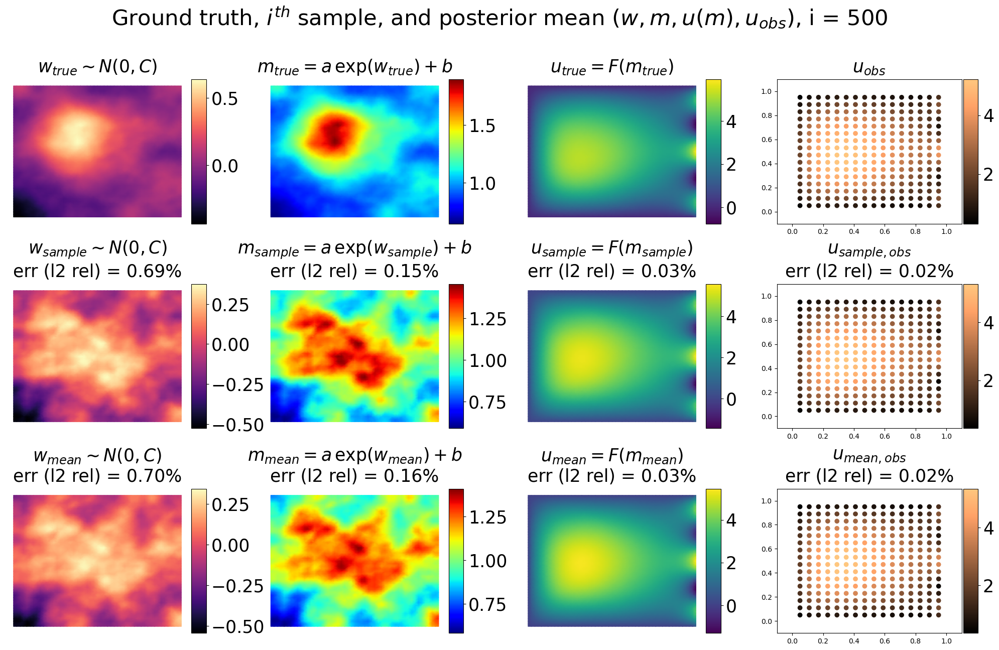

--------------------------------------------------
Sample:  650, Accepted samples:   27, Acceptance Rate: 4.154e-02, Cost mean: 4.798e+01. 
Tracing 50 samples took 1.106e+01s
Error (%) in w: ||w - w_mean|| = 6.915e+01, ||w - w_sample|| = 6.477e+01
Error (%) in m: ||m - m_mean|| = 1.584e+01, ||m - m_sample|| = 1.416e+01
Error (%) in u: ||u - u_mean|| = 2.861e+00, ||u - u_sample|| = 2.894e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 2.407e+00, ||u_obs - u_obs_sample|| = 2.231e+00
--------------------------------------------------
--------------------------------------------------
Sample:  700, Accepted samples:   28, Acceptance Rate: 4.000e-02, Cost mean: 4.668e+01. 
Tracing 50 samples took 6.209e+00s
Error (%) in w: ||w - w_mean|| = 6.833e+01, ||w - w_sample|| = 6.534e+01
Error (%) in m: ||m - m_mean|| = 1.562e+01, ||m - m_sample|| = 1.400e+01
Error (%) in u: ||u - u_mean|| = 2.838e+00, ||u - u_sample|| = 2.939e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 2.365e+00, ||u_obs - u_

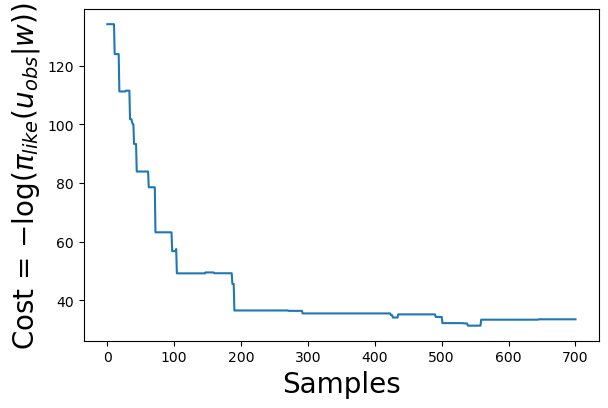

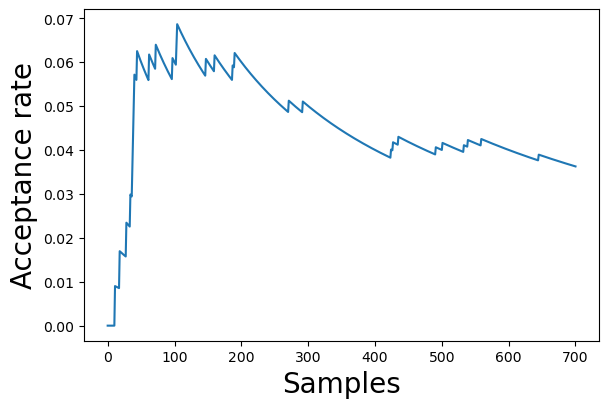

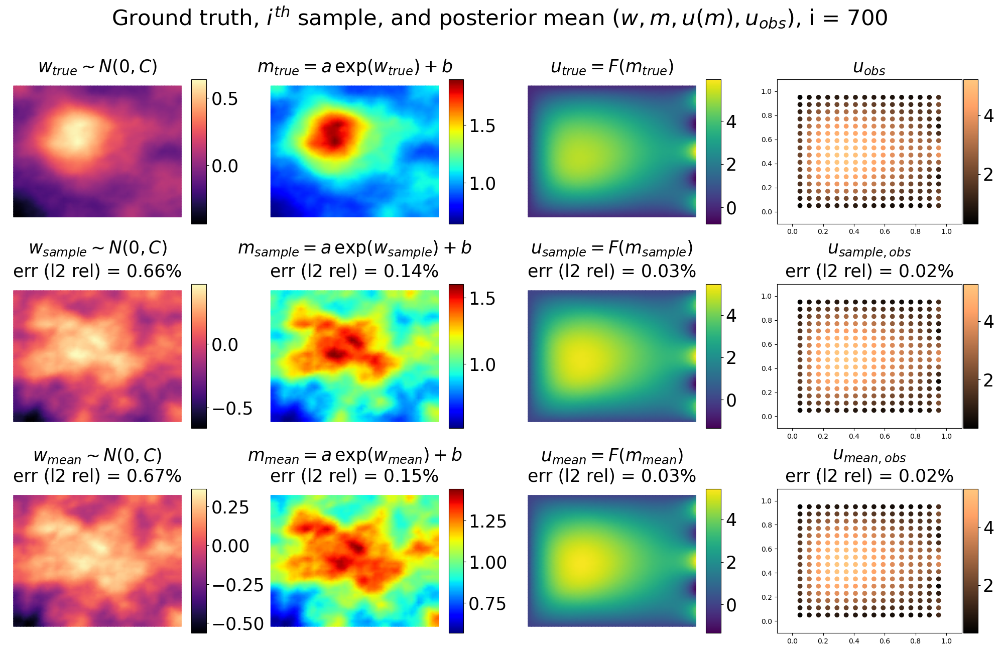

--------------------------------------------------
Sample:  850, Accepted samples:   29, Acceptance Rate: 3.412e-02, Cost mean: 4.400e+01. 
Tracing 50 samples took 1.161e+01s
Error (%) in w: ||w - w_mean|| = 6.650e+01, ||w - w_sample|| = 6.561e+01
Error (%) in m: ||m - m_mean|| = 1.507e+01, ||m - m_sample|| = 1.376e+01
Error (%) in u: ||u - u_mean|| = 2.743e+00, ||u - u_sample|| = 2.677e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 2.272e+00, ||u_obs - u_obs_sample|| = 2.307e+00
--------------------------------------------------
--------------------------------------------------
Sample:  900, Accepted samples:   31, Acceptance Rate: 3.444e-02, Cost mean: 4.329e+01. 
Tracing 50 samples took 6.905e+00s
Error (%) in w: ||w - w_mean|| = 6.601e+01, ||w - w_sample|| = 6.708e+01
Error (%) in m: ||m - m_mean|| = 1.493e+01, ||m - m_sample|| = 1.422e+01
Error (%) in u: ||u - u_mean|| = 2.721e+00, ||u - u_sample|| = 2.858e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 2.253e+00, ||u_obs - u_

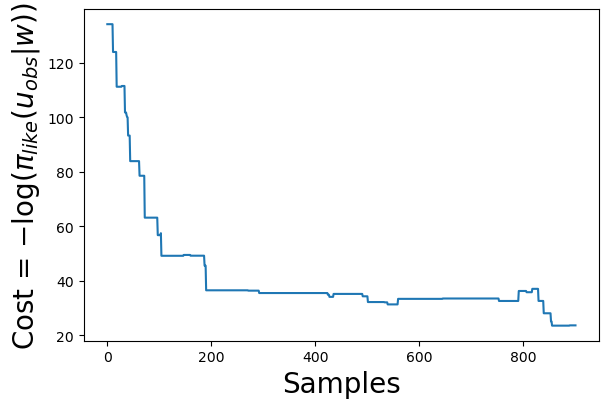

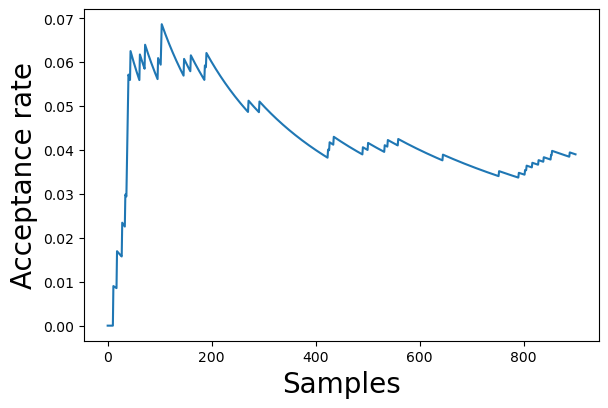

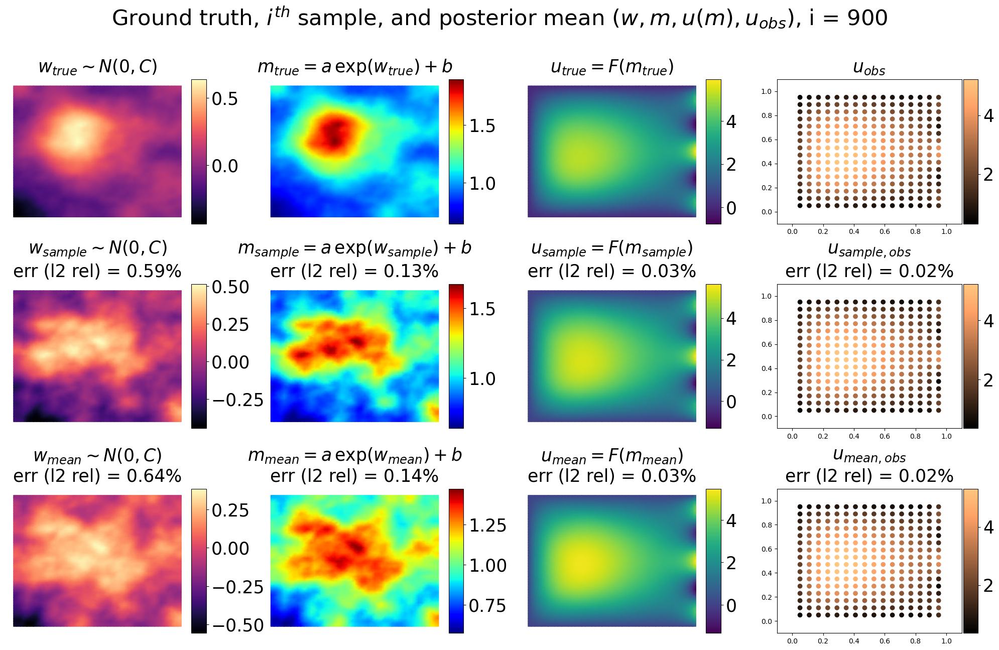

--------------------------------------------------
Sample: 1050, Accepted samples:   39, Acceptance Rate: 3.714e-02, Cost mean: 4.082e+01. 
Tracing 50 samples took 1.150e+01s
Error (%) in w: ||w - w_mean|| = 6.302e+01, ||w - w_sample|| = 5.884e+01
Error (%) in m: ||m - m_mean|| = 1.423e+01, ||m - m_sample|| = 1.266e+01
Error (%) in u: ||u - u_mean|| = 2.569e+00, ||u - u_sample|| = 2.534e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 2.114e+00, ||u_obs - u_obs_sample|| = 1.937e+00
--------------------------------------------------
--------------------------------------------------
MCMC finished in 1.620e+02s. 
Total samples: 1100, Accepted samples:   40, Acceptance Rate: 3.636e-02, Cost mean: 3.987e+01
--------------------------------------------------


In [14]:
n_samples = 1000
n_burnin = 100
pcn_beta = 0.2
print_every = 50
display_plot_every = 4*print_every

mcmc.surrogate_to_use = None

savepath_base = results_dir + 'test_mcmc_results_n_samples_{:d}_n_burnin_{:d}_pcn_beta_{:.3f}_sigma_{:.3e}'.format(n_samples, n_burnin, pcn_beta, sigma_noise)

if mcmc.surrogate_to_use is not None:
    savepath = savepath_base + '_surrogate_{}/'.format(mcmc.surrogate_to_use)
else:
    savepath = savepath_base + '/'

os.makedirs(savepath, exist_ok = True)

savefilename = 'tracer'

mcmc.run(n_samples = n_samples, n_burnin = n_burnin, \
         pcn_beta = pcn_beta, sigma_noise = sigma_noise, \
         print_every = print_every, print_lvl = 2, \
         display_plot_every = display_plot_every, \
         savefilename = savefilename, \
         init_tracer = True, \
         savepath = savepath)

## Load tracer and plot

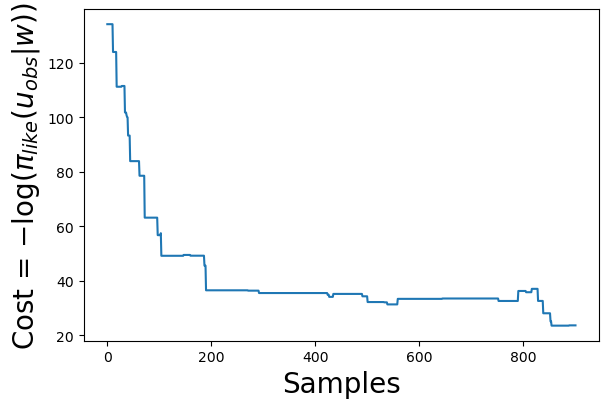

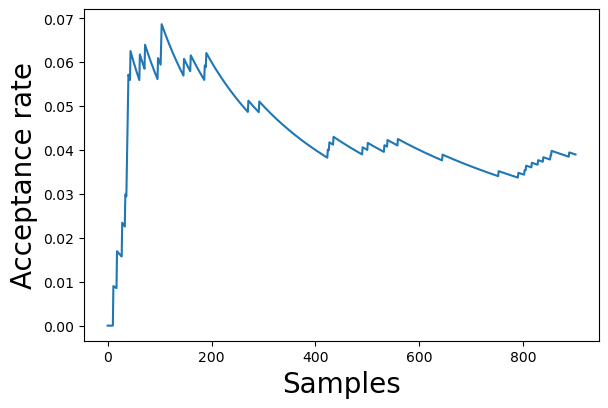

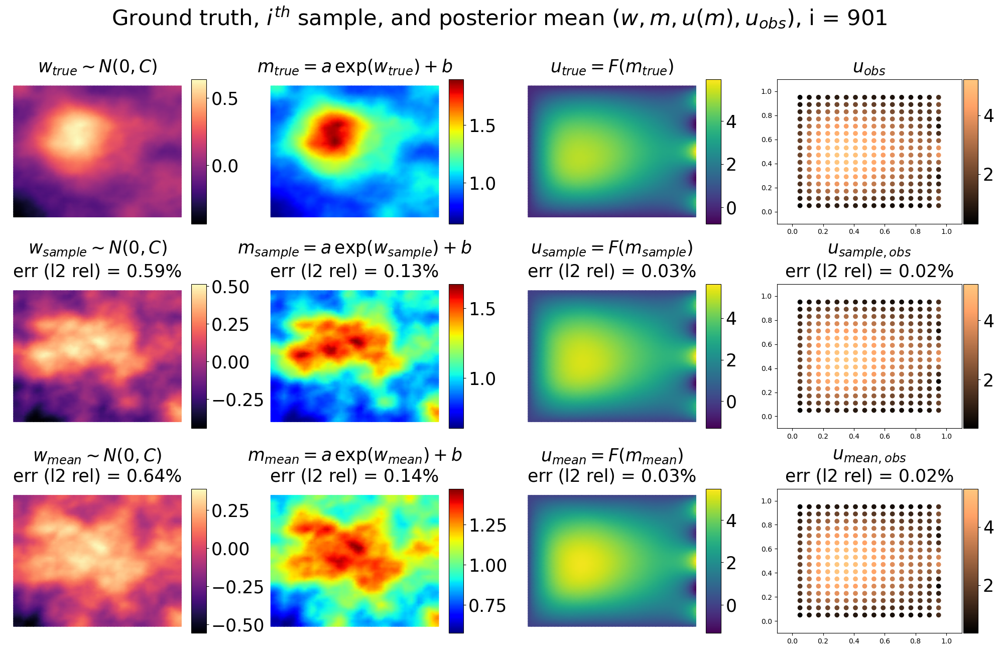

In [16]:
load_tracer = pickle.load(open(savepath + 'tracer' + '.pkl', 'rb'))

load_tracer.acceptances, load_tracer.current_acceptance_rate

savefig = False
plot_curve(load_tracer.accepted_samples_cost, xl=r'Samples', \
        yl= r'Cost = $-\log(\pi_{like}(u_{obs} | w))$', \
        fs = 20, lw = 3, figsize=[6,4])

plot_curve(load_tracer.acceptance_rate, xl=r'Samples', \
        yl= r'Acceptance rate', \
        fs = 20, lw = 3, figsize=[6,4])


w_mean = load_tracer.accepted_samples_mean_m
w_sample_i = len(load_tracer.accepted_samples_m) - 1
w_sample = load_tracer.accepted_samples_m[w_sample_i]

mcmc_plot_fields_base(w_mean, w_sample, w_sample_i, mcmc, savefilename = None)

# Use surrogate and run the same problem

### DeepONet

In [ ]:
mcmc.surrogate_to_use = 'DeepONet'

if mcmc.surrogate_to_use is not None:
    savepath = savepath_base + '_surrogate_{}/'.format(mcmc.surrogate_to_use)
else:
    savepath = savepath_base + '/'

os.makedirs(savepath, exist_ok = True)

savefilename = 'tracer'

mcmc.run(n_samples = n_samples, n_burnin = n_burnin, \
         pcn_beta = pcn_beta, sigma_noise = sigma_noise, \
         print_every = print_every, print_lvl = 2, \
         display_plot_every = display_plot_every, \
         savefilename = savefilename, \
         savepath = savepath, init_tracer = True)

--------------------------------------------------
MCMC started with 1000 samples and 100 burnin
PCN beta: 2.000e-01, sigma_noise: 1.393e-01
Model used for solving the forward problem: DeepONet
Tracer save path: test_mcmc_results_n_samples_1000_n_burnin_100_pcn_beta_0.200_sigma_1.393e-01_surrogate_DeepONet
Tracer save filename: tracer
--------------------------------------------------
initializing the current state. Initial cost: 3.832e+03
--------------------------------------------------
Burnin:    0, Cost: 3.832e+03
--------------------------------------------------
--------------------------------------------------
Burnin:   50, Cost: 2.717e+02
--------------------------------------------------
--------------------------------------------------
Sample:  100, Accepted samples:    0, Acceptance Rate: 0.000e+00, Cost mean: 0.000e+00. 
Tracing 50 samples took 1.139e+01s
Error (%) in w: ||w - w_mean|| = 1.000e+02, ||w - w_sample|| = 1.000e+02
Error (%) in m: ||m - m_mean|| = 2.244e+01, 

### PCANet

In [ ]:
mcmc.surrogate_to_use = 'PCANet'

if mcmc.surrogate_to_use is not None:
    savepath = savepath_base + '_surrogate_{}/'.format(mcmc.surrogate_to_use)
else:
    savepath = savepath_base + '/'

os.makedirs(savepath, exist_ok = True)

savefilename = 'tracer'

mcmc.run(n_samples = n_samples, n_burnin = n_burnin, \
         pcn_beta = pcn_beta, sigma_noise = sigma_noise, \
         print_every = print_every, print_lvl = 2, \
         display_plot_every = display_plot_every, \
         savefilename = savefilename, \
         savepath = savepath, init_tracer = True)

# Plotting

In [ ]:
s = compute_sample_errors(mcmc)
print(s)

In [ ]:
savefig = False
plot_curve(mcmc.tracer.accepted_samples_cost, xl=r'Samples', \
        yl= r'Cost = $-\log(\pi_{like}(u_{obs} | w))$', \
        fs = 20, lw = 3, \
        savefig = savefig, figsize=[6,4])

In [ ]:
savefig = False
plot_curve(mcmc.tracer.acceptance_rate, xl=r'Samples', \
        yl= r'Acceptance rate', \
        fs = 20, lw = 3, \
        savefig = savefig, figsize=[6,4])

In [ ]:
w_mean = mcmc.tracer.accepted_samples_mean_m
w_sample_i = len(mcmc.tracer.accepted_samples_m) - 1
w_sample = mcmc.tracer.accepted_samples_m[w_sample_i]

plot_fields_base(w_mean, w_sample, w_sample_i, mcmc, savefilename = None)

In [ ]:
nsamples = len(mcmc.tracer.accepted_samples_m)
ignore_n = int(0.3 * nsamples)
ignore_end_n = int((1. - 0.) * nsamples)
w_mean = np.mean(mcmc.tracer.accepted_samples_m[ignore_n:ignore_end_n, :], axis = 0)
w_sample_i = len(mcmc.tracer.accepted_samples_m) - 1
w_sample = mcmc.tracer.accepted_samples_m[w_sample_i]

save_sf = True
plot_sf = mcmc.tracer.savepath + 'true_and_posterior_mean_w_m_u_remove_{}_samples_iter_{}.png'.format(ignore_n, nsamples)
plot_fields_base(w_mean, w_sample, w_sample_i, mcmc, savefilename = plot_sf if save_sf else None)

In [ ]:
mcmc_data = np.load(savepath + savefilename + '.npz')
mcmc_data['sigma_noise']